In [ ]:
#---
# WDQ7005 - Data Mining
# Master of Data Science | University of Malaya
# Assignemnt: Part D (Milestone 4) - Interpretation and Communicating Data Insights 
#             - leveraging on the Group Assignment COVID-19 datasets
#
# Student Name: Kok Hon Loong (WQD170086)
# Date: 19th May 2020
#---

In [1]:
# Importing relevant library packages usage for the assignment

# --- setup ---
import requests
import gc
import os
import random
import sys

import pandas as pd
pd.set_option('max_columns', 50)

from tqdm.notebook import tqdm
import numpy as np
import scipy as sp
import math
import time
from datetime import datetime
import operator

from IPython.core.display import display, HTML

# Importing the libraries packages for plotting graph and charts
import matplotlib.pyplot as plt
plt.style.use('ggplot')
plt.figure(figsize=(20,10))
%matplotlib inline
import matplotlib.colors as mcolors

import seaborn as sns
plt.style.use('seaborn')

from plotly import tools, subplots
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as pio
pio.templates.default = "plotly_dark"

# Importing library packages for web scrapping and Machine Learning

# Web crawling library - BeautifulSoup
from bs4 import BeautifulSoup

# Defining the Text style to be printed
class txtStyle:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

# --- models ---
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.model_selection import KFold

import itertools
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, acf, pacf,arma_order_select_ic
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
import warnings
warnings.simplefilter('ignore')

import lightgbm as lgb
import xgboost as xgb
import catboost as cb

In [2]:
# Crawl for near real-time datasets to be use for this assignment and store it into dataframe respectively

# Configuring the website to acquire the datasets
def switcher(x):
    return {
        0: "https://github.com/CSSEGISandData/COVID-19/blob/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv",
        1: "https://github.com/CSSEGISandData/COVID-19/blob/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv",
        2: "https://github.com/CSSEGISandData/COVID-19/blob/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv",
    }[x]

try:
    for i in range(3):
        page = requests.get(switcher(i), timeout=5)
        if page.status_code == 200:
            soup = BeautifulSoup(page.content,'html.parser')
            table = soup.find("table", {"class": "js-csv-data csv-data js-file-line-container"})
            if i == 0:
                df_confirmed = pd.read_html(str(table))
            elif i == 1:
                df_deaths = pd.read_html(str(table))
            else:
                df_recovered = pd.read_html(str(table))
        else:
            print(str(page.status_code) + " - Error, page not found.")
except requests.ConnectionError as e:
    print('Connection error')
    print(str(e))

# Put the tabulated data into a dataframe :
confirmed_cases = df_confirmed[0]
death_cases = df_deaths[0]
recovered_cases = df_recovered[0]


In [3]:
# Display Confirmed Cases dataset acquired
confirmed_cases

,Unnamed: 0,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,...,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20
0,NaN,NaN,Afghanistan,33.000000,65.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2469,2704,2894,3224,3392,3563,3778,4033,4402,4687,4963,5226,5639,6053,6402,6664,7072,7653,8145,8676,9216,9998,10582,11173,11831
1,NaN,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,789,795,803,820,832,842,850,856,868,872,876,880,898,916,933,946,948,949,964,969,981,989,998,1004,1029
2,NaN,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,4295,4474,4648,4838,4997,5182,5369,5558,5723,5891,6067,6253,6442,6629,6821,7019,7201,7377,7542,7728,7918,8113,8306,8503,8697
3,NaN,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,747,748,750,751,751,752,752,754,755,755,758,760,761,761,761,761,761,761,762,762,762,762,762,763,763
4,NaN,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,35,35,35,36,36,36,43,43,45,45,45,45,48,48,48,48,50,52,52,58,60,61,69,70,70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,NaN,NaN,Sao Tome and Principe,0.186360,6.613081,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,16,16,23,174,174,187,208,208,208,208,208,220,235,235,235,235,246,251,251,251,251,251,251,299,441
262,NaN,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,10,10,12,22,25,25,34,34,51,56,65,70,85,106,122,128,130,167,184,197,209,212,222,233,249
263,NaN,NaN,Comoros,-11.645500,43.333300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3,3,3,3,8,8,8,11,11,11,11,11,11,11,11,11,11,11,34,34,78,78,87,87,87
264,NaN,NaN,Tajikistan,38.861034,71.276093,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,76,128,230,293,379,461,522,612,612,661,729,801,907,1118,1322,1524,1729,1936,2140,2350,2551,2738,2929,3100,3266


In [4]:
# Display Death Cases dataset acquired
death_cases

,Unnamed: 0,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,...,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20
0,NaN,NaN,Afghanistan,33.000000,65.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,72,85,90,95,104,106,109,115,120,122,127,132,136,153,168,169,173,178,187,193,205,216,218,219,220
1,NaN,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,32,32,33
2,NaN,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,459,463,465,470,476,483,488,494,502,507,515,522,529,536,542,548,555,561,568,575,582,592,600,609,617
3,NaN,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,44,45,45,46,46,47,47,48,48,48,48,49,49,49,51,51,51,51,51,51,51,51,51,51,51
4,NaN,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,3,3,3,3,3,4,4,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,NaN,NaN,Sao Tome and Principe,0.186360,6.613081,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,1,3,3,3,4,5,5,5,5,5,6,7,7,7,7,7,8,8,8,8,8,8,11,12
262,NaN,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2,2,2,4,5,5,7,7,8,9,10,12,12,15,18,20,20,28,30,33,33,39,42,44,49
263,NaN,NaN,Comoros,-11.645500,43.333300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
264,NaN,NaN,Tajikistan,38.861034,71.276093,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2,2,3,5,8,12,12,20,20,21,21,23,29,33,36,39,41,41,41,44,44,44,46,46,47


In [5]:
# Display Recovered Cases dataset acquired
recovered_cases

,Unnamed: 0,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,...,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20
0,NaN,NaN,Afghanistan,33.000000,65.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,331,345,397,421,458,468,472,502,558,558,610,648,691,745,745,778,801,850,930,938,996,1040,1075,1097,1128
1,NaN,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,519,531,543,570,595,605,620,627,650,654,682,688,694,705,714,715,727,742,758,771,777,783,789,795,803
2,NaN,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1872,1936,1998,2067,2197,2323,2467,2546,2678,2841,2998,3058,3158,3271,3409,3507,3625,3746,3968,4062,4256,4426,4784,4747,4918
3,NaN,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,472,493,499,514,521,526,537,545,550,550,568,576,596,604,615,617,624,628,639,639,652,653,653,663,676
4,NaN,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,11,11,11,11,11,11,11,13,13,13,13,14,14,17,17,17,17,17,17,17,17,18,18,18,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,NaN,NaN,Sao Tome and Principe,0.186360,6.613081,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,68
249,NaN,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,5,5,5,11,11,10,10,10
250,NaN,NaN,Comoros,-11.645500,43.333300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,3,3,3,3,3,3,8,8,18,18,21,21,21
251,NaN,NaN,Tajikistan,38.861034,71.276093,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,641,470,470,1089,1223,1301,1395,1417


In [6]:
# Converting the date type to string for all datasets
def _convert_date_str(df):
    try:
        df.columns = list(df.columns[:5]) + [datetime.strptime(d, "%m/%d/%y").date().strftime("%Y-%m-%d") for d in df.columns[5:]]
    except:
        print('_convert_date_str failed with %y, try %Y')
        df.columns = list(df.columns[:5]) + [datetime.strptime(d, "%m/%d/%Y").date().strftime("%Y-%m-%d") for d in df.columns[5:]]

_convert_date_str(confirmed_cases)
_convert_date_str(death_cases)
_convert_date_str(recovered_cases)


In [7]:
# Rename column name and filter out problematic data points (i.e. NULL value)
# removed_states = "Recovered|Grand Princess|Diamond Princess"
# removed_countries = "US|The West Bank and Gaza"

confirmed_cases.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)
death_cases.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)
recovered_cases.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)

# confirmed_cases = confirmed_cases[~confirmed_cases["Province_State"].replace(np.nan, "nan").str.match(removed_states)]
# death_cases    = death_cases[~death_cases["Province_State"].replace(np.nan, "nan").str.match(removed_states)]
# recovered_cases = recovered_cases[~recovered_cases["Province_State"].replace(np.nan, "nan").str.match(removed_states)]

# confirmed_cases = confirmed_cases[~confirmed_cases["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]
# death_cases    = death_cases[~death_cases["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]
# recovered_cases = recovered_cases[~recovered_cases["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]


In [8]:
# Clean the datasets by melting all the dates data to sum it into total cases with a new field at the end of the column by country and then store it in the respective melt dataframe
confirmed_globalMelt = confirmed_cases.melt(
    id_vars=['Unnamed: 0', 'Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_cases.columns[5:], var_name='Date', value_name='ConfirmedCases')
death_globalMelt = death_cases.melt(
    id_vars=['Unnamed: 0', 'Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=death_cases.columns[5:], var_name='Date', value_name='DeathCases')
recovered_globalMelt = recovered_cases.melt(
    id_vars=['Unnamed: 0', 'Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=recovered_cases.columns[5:], var_name='Date', value_name='RecoveredCases')

In [ ]:
#---
#  Business Intelligence (BI): to describe and diagnose the current COVID-19 situation worldwide
#---

In [9]:
# Combined the Confirmed, Death and Recovered cases dataframe into into one 'train' dataframe
train = confirmed_globalMelt.merge(death_globalMelt, on=['Unnamed: 0', 'Country_Region', 'Province_State', 'Lat', 'Long', 'Date'])
train = train.merge(recovered_globalMelt, on=['Unnamed: 0', 'Country_Region', 'Province_State', 'Lat', 'Long', 'Date'])
train

,Unnamed: 0,Country_Region,Province_State,Lat,Long,Date,ConfirmedCases,DeathCases,RecoveredCases
0,NaN,Afghanistan,NaN,33.000000,65.000000,2020-01-22,0,0,0
1,NaN,Albania,NaN,41.153300,20.168300,2020-01-22,0,0,0
2,NaN,Algeria,NaN,28.033900,1.659600,2020-01-22,0,0,0
3,NaN,Andorra,NaN,42.506300,1.521800,2020-01-22,0,0,0
4,NaN,Angola,NaN,-11.202700,17.873900,2020-01-22,0,0,0
...,...,...,...,...,...,...,...,...,...
29983,NaN,France,Saint Pierre and Miquelon,46.885200,-56.315900,2020-05-26,1,0,1
29984,NaN,Western Sahara,NaN,24.215500,-12.885800,2020-05-26,9,1,6
29985,NaN,Sao Tome and Principe,NaN,0.186360,6.613081,2020-05-26,441,12,68
29986,NaN,Comoros,NaN,-11.645500,43.333300,2020-05-26,87,1,21


In [10]:
# Rename the column name to lowercases
train.rename({'Country_Region': 'country', 'Province_State': 'province', 'Id': 'id', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'DeathCases': 'fatalities', 'RecoveredCases': 'recovered'}, axis=1, inplace=True)
train['country_province'] = train['country'].fillna('') + '/' + train['province'].fillna('')

# Group the records by date for confirmed and fatalities cases
ww_df = train.groupby('date')[['confirmed', 'fatalities']].sum().reset_index()

# Add a new column for new_case by having confirmed cases minus yesterday confirmed cases daily
ww_df['newCase'] = ww_df['confirmed'] - ww_df['confirmed'].shift(1)
ww_df.head()

,date,confirmed,fatalities,newCase
0,2020-01-22,540,17,NaN
1,2020-01-23,629,18,89.0
2,2020-01-24,903,25,274.0
3,2020-01-25,1349,41,446.0
4,2020-01-26,1963,53,614.0


In [11]:
# Pivoting the dataframe by categorizing the variable type
ww_melt_df = pd.melt(ww_df, id_vars=['date'], value_vars=['confirmed', 'fatalities', 'newCase'])
ww_melt_df

,date,variable,value
0,2020-01-22,confirmed,540.0
1,2020-01-23,confirmed,629.0
2,2020-01-24,confirmed,903.0
3,2020-01-25,confirmed,1349.0
4,2020-01-26,confirmed,1963.0
...,...,...,...
373,2020-05-22,newCase,106718.0
374,2020-05-23,newCase,97966.0
375,2020-05-24,newCase,95498.0
376,2020-05-25,newCase,86018.0


In [12]:
# Plotting a graph to illustrate the Confirmed, Death and New Daily reported cases over time 
fig = px.line(ww_melt_df, x="date", y="value", color='variable', 
              title="Worldwide COVID-19 Confirmed, Fatalities and New Daily Cases Over Time")
fig.show()

In [13]:
# Plotting a graph to illustrating the rate of the growth reported cases using the log-scale
fig = px.line(ww_melt_df, x="date", y="value", color='variable',
              title="Worldwide COVID-19 Confirmed, Fatalities and New Daily Cases Over Time (Log scale)",
             log_y=True)
fig.show()

In [14]:
# Plotting a graph to view on the Mortality rate over time
ww_df['mortality'] = ww_df['fatalities'] / ww_df['confirmed']

fig = px.line(ww_df, x="date", y="mortality", 
              title="Worldwide COVID-19 Mortality Rate Over Time (Death Cases /Confirmed Cases )")
fig.show()

In [15]:
# To analyze on the County COVID-19 growth Confirmed and Fatalities cases
country_df = train.groupby(['date', 'country'])[['confirmed', 'fatalities', 'recovered']].sum().reset_index()
country_df.tail(20)

,date,country,confirmed,fatalities,recovered
22282,2020-05-26,Taiwan*,441,7,416
22283,2020-05-26,Tanzania,509,21,183
22284,2020-05-26,Thailand,3045,57,2929
22285,2020-05-26,Togo,391,13,177
22286,2020-05-26,Trinidad and Tobago,116,8,108
22287,2020-05-26,Tunisia,1051,48,929
22288,2020-05-26,Turkey,158762,4397,121507
22289,2020-05-26,US,1680913,98913,384902
22290,2020-05-26,Uganda,253,0,69
22291,2020-05-26,Ukraine,21584,644,7575


In [16]:
# To list down the countries in the dataset
countries = country_df['country'].unique()
print(f'{len(countries)} countries are in dataset:\n{countries}')

177 countries are in dataset:
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia' 'Bosnia and Herzegovina'
 'Botswana' 'Brazil' 'Brunei' 'Bulgaria' 'Burkina Faso' 'Burma' 'Burundi'
 'Cabo Verde' 'Cambodia' 'Central African Republic' 'Chad' 'Chile' 'China'
 'Colombia' 'Comoros' 'Congo (Brazzaville)' 'Congo (Kinshasa)'
 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba' 'Cyprus' 'Denmark'
 'Diamond Princess' 'Djibouti' 'Dominica' 'Dominican Republic' 'Ecuador'
 'Egypt' 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Estonia' 'Eswatini'
 'Ethiopia' 'Fiji' 'Finland' 'France' 'Gabon' 'Gambia' 'Georgia' 'Germany'
 'Ghana' 'Greece' 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti'
 'Holy See' 'Honduras' 'Hungary' 'Iceland' 'India' 'Indonesia' 'Iran'
 'Iraq' 'Ireland' 'Israel' 'Italy' 'Jamaica' 'Japan' 'Jordan' 'Kaza

In [17]:
# To set a dataframe comprises of the ASEAN countries in the dataset

# Get data for ASEAN regions:
asean = ['Malaysia', 'Singapore', 'Thailand', 'Brunei', 'Cambodia', 'Indonesia', 'Laos', 'Myanmar', 'Philippines', 'Vietnam']

countriesSEA = asean
print(f'{len(countriesSEA)} countries are in dataset:\n{countriesSEA}')

10 countries are in dataset:
['Malaysia', 'Singapore', 'Thailand', 'Brunei', 'Cambodia', 'Indonesia', 'Laos', 'Myanmar', 'Philippines', 'Vietnam']


In [18]:
# Identify the last date capture in the dataset
target_date = country_df['date'].max()
print('Date: ', target_date)

# Count the number of countries with cases falling into the 5 categories
for i in [1, 10, 100, 1000, 10000]:
    n_countries = len(country_df.query('(date == @target_date) & confirmed > @i'))
    print(f'{n_countries} countries have more than {i} confirmed COVID-19 cases')

Date:  2020-05-26
177 countries have more than 1 confirmed COVID-19 cases
173 countries have more than 10 confirmed COVID-19 cases
149 countries have more than 100 confirmed COVID-19 cases
105 countries have more than 1000 confirmed COVID-19 cases
48 countries have more than 10000 confirmed COVID-19 cases


In [19]:
print('Date: ', target_date)
# Count the number of ASEAN countries with cases falling into the 5 categories
for i in [1, 10, 100, 1000, 10000]:
    n_countriesSEA = len(country_df.query('(date == @target_date) & (country == @countriesSEA) & confirmed > @i'))
    print(f'{n_countriesSEA} ASEAN countries have more than {i} confirmed COVID-19 cases')

Date:  2020-05-26
8 ASEAN countries have more than 1 confirmed COVID-19 cases
8 ASEAN countries have more than 10 confirmed COVID-19 cases
8 ASEAN countries have more than 100 confirmed COVID-19 cases
5 ASEAN countries have more than 1000 confirmed COVID-19 cases
3 ASEAN countries have more than 10000 confirmed COVID-19 cases


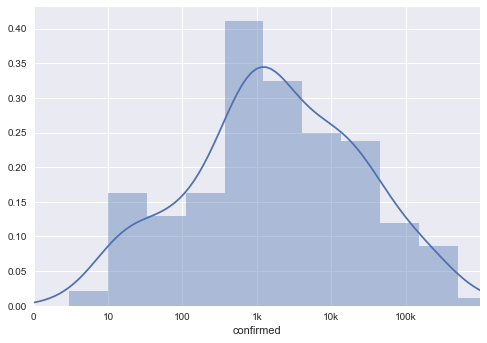

In [20]:
# Count the number of countries with cases falling into the 5 categories and illustrate with a graph representation
ax = sns.distplot(np.log10(country_df.query('date == @target_date')['confirmed'] + 1))
ax.set_xlim([0, 6])
ax.set_xticks(np.arange(7))
_ = ax.set_xticklabels(['0', '10', '100', '1k', '10k', '100k'])

In [21]:
# To view in a chart which are the top countries of confirmed and fatalities COVID-19 cases
top_country_df = country_df.query('(date == @target_date) & (confirmed > 1000)').sort_values('confirmed', ascending=False)
top_country_melt_df = pd.melt(top_country_df, id_vars='country', value_vars=['confirmed', 'fatalities'])

fig = px.bar(top_country_melt_df.iloc[::-1],
             x='value', y='country', color='variable', barmode='group',
             title=f'Top Countries with accumulated Confirmed and Fatalities COVID-19 cases reported on {target_date}', text='value', height=2000, orientation='h')
fig.show()

In [22]:
# To view in a chart which are the ASEAN countries of confirmed and fatalities COVID-19 cases
top_countrySEA_df = country_df.query('(date == @target_date) & (country == @countriesSEA) ').sort_values('confirmed', ascending=False)
top_countrySEA_melt_df = pd.melt(top_countrySEA_df, id_vars='country', value_vars=['confirmed', 'fatalities'])

fig = px.bar(top_countrySEA_melt_df.iloc[::-1],
             x='value', y='country', color='variable', barmode='group',
             title=f'ASEAN Countries with accumulated Confirmed and Fatalities COVID-19 cases reported on {target_date}', text='value', height=650, orientation='h')
fig.show()

In [23]:
# Plotting the graph for Top 30 countries with COVID-19 Confirmed cases
top30_countries = top_country_df.sort_values('confirmed', ascending=False).iloc[:30]['country'].unique()
top30_countries_df = country_df[country_df['country'].isin(top30_countries)]
fig = px.line(top30_countries_df,
              x='date', y='confirmed', color='country',
              title=f'Confirmed COVID-19 Cases for Top 30 countries as of {target_date}')
fig.show()

In [24]:
# Plotting the graph for Top 30 countries with COVID-19 Fatilities cases
top30_countries = top_country_df.sort_values('fatalities', ascending=False).iloc[:30]['country'].unique()
top30_countries_df = country_df[country_df['country'].isin(top30_countries)]
fig = px.line(top30_countries_df,
              x='date', y='fatalities', color='country',
              title=f'COVID-19 Fatalities Cases for Top 30 countries as of {target_date}')
fig.show()

In [25]:
# Plotting a graph to illustrate the High Mortality rate by Country
top_country_df = country_df.query('(date == @target_date) & (confirmed > 100)')
top_country_df['mortality_rate'] = top_country_df['fatalities'] / top_country_df['confirmed']
top_country_df = top_country_df.sort_values('mortality_rate', ascending=False)

fig = px.bar(top_country_df[:30].iloc[::-1],
             x='mortality_rate', y='country',
             title=f'High Mortality Rate on COVID-19: Top 30 countries on {target_date} (Fatalities / Confirmed)', text='mortality_rate', height=800, orientation='h')
fig.show()

In [26]:
# Plotting a graph to illustrate the Low Mortality rate by Country
fig = px.bar(top_country_df[-30:],
             x='mortality_rate', y='country',
             title=f'Low Mortality Rate on COVID-19: Top 30 countries on {target_date} (Fatalities / Confirmed)', text='mortality_rate', height=800, orientation='h')
fig.show()

In [27]:
# Plotting the graph for ASEAN countries with COVID-19 Confirmed cases
topSEAc_countries = top_countrySEA_df.sort_values('confirmed', ascending=False).iloc[:]['country'].unique()
topSEAc_countries_df = country_df[country_df['country'].isin(topSEAc_countries)]
fig = px.line(topSEAc_countries_df,
              x='date', y='confirmed', color='country',
              title=f'Confirmed COVID-19 Cases for ASEAN countries as of {target_date}')
fig.show()

In [28]:
# Plotting the graph for ASEAN countries with COVID-19 Recovered cases
topSEAc_countries = top_countrySEA_df.sort_values('confirmed', ascending=False).iloc[:]['country'].unique()
topSEAc_countries_df = country_df[country_df['country'].isin(topSEAc_countries)]
fig = px.line(topSEAc_countries_df,
              x='date', y='recovered', color='country',
              title=f'Recovered COVID-19 Cases for ASEAN countries as of {target_date}')
fig.show()

In [29]:
# Plotting the graph for ASEAN countries with COVID-19 Fatilities cases
topSEAf_countries = top_countrySEA_df.sort_values('fatalities', ascending=False).iloc[:]['country'].unique()
topSEAf_countries_df = country_df[country_df['country'].isin(topSEAf_countries)]
fig = px.line(topSEAf_countries_df,
              x='date', y='fatalities', color='country',
              title=f'COVID-19 Fatalities Cases for ASEAN countries as of {target_date}')
fig.show()

In [30]:
# Plotting a graph to illustrate the Mortality rate for ASEAN Country
countrySEA_df = country_df.query('(date == @target_date) & (country == @countriesSEA)')
countrySEA_df['mortality_rate'] = countrySEA_df['fatalities'] / countrySEA_df['confirmed']
countrySEA_df = countrySEA_df.sort_values('mortality_rate', ascending=False)

fig = px.bar(countrySEA_df[:].iloc[::-1],
             x='mortality_rate', y='country',
             title=f'Mortality Rate on COVID-19: ASEAN countries on {target_date} (Fatalities /  Confirmed)', text='mortality_rate', height=500, orientation='h')
fig.show()

In [31]:
# To view the Worldwide Confirmed Cases on map
all_country_df = country_df.query('date == @target_date')
all_country_df['confirmed_log1p'] = np.log10(all_country_df['confirmed'] + 1)
all_country_df['fatalities_log1p'] = np.log10(all_country_df['fatalities'] + 1)
all_country_df['mortality_rate'] = all_country_df['fatalities'] / all_country_df['confirmed']

fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="confirmed_log1p", 
                    hover_name="country", hover_data=["confirmed", 'fatalities', 'mortality_rate'],
                    range_color=[all_country_df['confirmed_log1p'].min(), all_country_df['confirmed_log1p'].max()], 
                    color_continuous_scale="peach", 
                    title=f'Worldwide Countries with COVID-19 Confirmed Cases as of {target_date}')

# To update colorbar to show raw values, but this does not work somehow...
trace1 = list(fig.select_traces())[0]
trace1.colorbar = go.choropleth.ColorBar(
    tickvals=[0, 1, 2, 3, 4, 5],
    ticktext=['1', '10', '100', '1000','10000', '10000'])
fig.show()

In [32]:
# To view the Worldwide Fatalities on map
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="fatalities_log1p", 
                    hover_name="country", range_color=[0, 4],
                    hover_data=['confirmed', 'fatalities', 'mortality_rate'],
                    color_continuous_scale="peach", 
                    title=f'Worldwide Countries with COVID-19 Fatalities Cases as of {target_date}')
fig.show()

In [33]:
# To view the Worldwide Mortality Rate on map
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="mortality_rate", 
                    hover_name="country", range_color=[0, 0.12], 
                    color_continuous_scale="peach", 
                    title=f'Worldwide Countries with COVID-19 Mortality Rate as of {target_date}')
fig.show()

In [34]:
# To plot the fatility growth for countries since 10 deaths
n_countries = 80
n_start_death = 10
fatality_top_countires = top_country_df.sort_values('fatalities', ascending=False).iloc[:n_countries]['country'].values
country_df['date'] = pd.to_datetime(country_df['date'])


df_list = []
for country in fatality_top_countires:
    this_country_df = country_df.query('country == @country')
    start_date = this_country_df.query('fatalities > @n_start_death')['date'].min()
    this_country_df = this_country_df.query('date >= @start_date')
    this_country_df['date_since'] = this_country_df['date'] - start_date
    this_country_df['fatalities_log1p'] = np.log10(this_country_df['fatalities'] + 1)
    this_country_df['fatalities_log1p'] -= this_country_df['fatalities_log1p'].values[0]
    df_list.append(this_country_df)

tmpdf = pd.concat(df_list)
tmpdf['date_since_days'] = tmpdf['date_since'] / pd.Timedelta('1 days')

fig = px.line(tmpdf,
              x='date_since_days', y='fatalities_log1p', color='country',
              title=f'COVID-19 Fatalities by Country since 10 Deaths, as of {target_date}')
fig.add_trace(go.Scatter(x=[0, 28], y=[0, 4], name='Double by 7 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.add_trace(go.Scatter(x=[0, 56], y=[0, 4], name='Double by 14 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.add_trace(go.Scatter(x=[0, 84], y=[0, 4], name='Double by 21 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.show()

# Observation: Sudden increase in China on the days 85, was due to the updated Death cases reported for Wuhan (Ref: https://www.bbc.com/news/world-asia-china-52321529)


In [35]:
# Daily newly Confirmed Cases trend reported
country_df['prev_confirmed'] = country_df.groupby('country')['confirmed'].shift(1)
country_df['new_case'] = country_df['confirmed'] - country_df['prev_confirmed']
country_df['new_case'].fillna(0, inplace=True)
top30_country_df = country_df[country_df['country'].isin(top30_countries)]

fig = px.line(top30_country_df,
              x='date', y='new_case', color='country',
              title=f'Daily New Confirmed COVID-19 Cases for Top 30 Countries Worldwide as of {target_date}')
fig.show()

In [36]:
# To illustrate Geographical Animation - Confirmed Cases spread over time
country_df['date'] = country_df['date'].apply(str)
country_df['confirmed_log1p'] = np.log1p(country_df['confirmed'])
country_df['fatalities_log1p'] = np.log1p(country_df['fatalities'])

fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="confirmed", size='confirmed', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['confirmed'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title=f'COVID-19: Worldwide Confirmed Cases Spread Over Time as of {target_date}', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig.show()

In [37]:
# To illustrate Geographical Animation - Fatalities Cases spread over time
fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="fatalities", size='fatalities', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['fatalities'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title=f'COVID-19: Worldwide Fatalities Growth Over Time as of {target_date}', color_continuous_scale="portland")
fig.show()

In [38]:
# To illustrate Geographical Animation - Daily New Cases Trend
country_df.loc[country_df['new_case'] < 0, 'new_case'] = 0.
fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="new_case", size='new_case', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['new_case'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title=f'COVID-19: Daily New Cases Reported Over Time in Worldwide as of {target_date}', color_continuous_scale="portland")
fig.show()

In [39]:
# To illustrate the condition of COVID-19 in Asia Pacific
top_asian_country_df = country_df[country_df['country'].isin(['China', 'Japan', 'Korea, South', 'Malaysia', 'Thailand', 'Philippines', 'Indonesia', 'Singapore', 'Vietnam', 'Australia', 'New Zealand', 'Taiwan*'])]

fig = px.line(top_asian_country_df,
              x='date', y='new_case', color='country',
              title=f'Daily New COVID-19 Confirmed Cases in Selected Pan-Asia Pacific Countries as of {target_date}')
fig.show()

In [40]:
# To analyze COVID-19 pandemic situation in China - Daily New Confirmed Cases
china_df = train.query('country == "China"')
china_df['prev_confirmed'] = china_df.groupby('province')['confirmed'].shift(1)
china_df['new_case'] = china_df['confirmed'] - china_df['prev_confirmed']
china_df.loc[china_df['new_case'] < 0, 'new_case'] = 0.

fig = px.line(china_df,
              x='date', y='new_case', color='province',
              title=f'Daily New COVID-19 Confirmed Cases in China by Province as of {target_date}')
fig.show()

In [ ]:
#---
#  Modelling: to forecast/predict COVID-19
#---

In [41]:
# Preparing to split the dataset
covid19_ds = train
covid19_ds

,Unnamed: 0,country,province,Lat,Long,date,confirmed,fatalities,recovered,country_province
0,NaN,Afghanistan,NaN,33.000000,65.000000,2020-01-22,0,0,0,Afghanistan/
1,NaN,Albania,NaN,41.153300,20.168300,2020-01-22,0,0,0,Albania/
2,NaN,Algeria,NaN,28.033900,1.659600,2020-01-22,0,0,0,Algeria/
3,NaN,Andorra,NaN,42.506300,1.521800,2020-01-22,0,0,0,Andorra/
4,NaN,Angola,NaN,-11.202700,17.873900,2020-01-22,0,0,0,Angola/
...,...,...,...,...,...,...,...,...,...,...
29983,NaN,France,Saint Pierre and Miquelon,46.885200,-56.315900,2020-05-26,1,0,1,France/Saint Pierre and Miquelon
29984,NaN,Western Sahara,NaN,24.215500,-12.885800,2020-05-26,9,1,6,Western Sahara/
29985,NaN,Sao Tome and Principe,NaN,0.186360,6.613081,2020-05-26,441,12,68,Sao Tome and Principe/
29986,NaN,Comoros,NaN,-11.645500,43.333300,2020-05-26,87,1,21,Comoros/


In [42]:
# NOTE: Must run the above data preparation above before running this cell each time.

# # Dropping the unwanted features and leave 1 unwanted feature to drop the data in x.
# covid19_ds = covid19_ds.drop('Unnamed: 0', axis=1)
# covid19_ds = covid19_ds.drop(['Lat','Long'], axis=1)
# covid19_ds = covid19_ds.drop('country_province', axis=1)

# # province is a label to predict province in y. Using the drop() function to take all other data in x.
# y=covid19_ds.province
# x=covid19_ds.drop('province',axis=1)

# # Split the acquired dataset with 80% for trainSet and 20% for testSet
# x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2)

# covid19_trainSet = x_train
# covid19_testSet = x_test

covid19_trainSet = covid19_ds
covid19_testSet = covid19_ds


In [ ]:
# # To view the new covid19_trainSet with 80% of the near real-time data acquired from web crawling
# covid19_trainSet

In [ ]:
# # To view the new covid19_testSet with 20% of the near real-time data acquired from web crawling
# covid19_testSet

In [ ]:
# # To sort and group the trainCC_df by country for confirmed cases
# trainCC_df = covid19_trainSet.fillna('NA').groupby(['country','date'])['confirmed'].sum() \
#                           .groupby(['country']).max().sort_values() \
#                           .groupby(['country']).sum().sort_values(ascending = False)

# top10_countries = pd.DataFrame(trainCC_df).head(10)
# top10_countries

In [43]:
# To sort and group the trainCC_df by country for confirmed cases
trainCC_df = covid19_ds.fillna('NA').groupby(['country','date'])['confirmed'].sum() \
                          .groupby(['country']).max().sort_values() \
                          .groupby(['country']).sum().sort_values(ascending = False)

top10_countries = pd.DataFrame(trainCC_df).head(10)
top10_countries

,confirmed
country,
US,1680913
Brazil,391222
Russia,362342
United Kingdom,266599
Spain,236259
Italy,230555
France,183067
Germany,181200
Turkey,158762


In [ ]:
# # To group the trainTS_df by date and country
# trainTS_df=covid19_trainSet.groupby(['date','country']).agg('sum').reset_index()
# trainTS_df

In [45]:
# To group the trainTS_df by date and country
trainTS_df=covid19_ds.groupby(['date','country']).agg('sum').reset_index()
trainTS_df.tail(5)

,date,country,Unnamed: 0,Lat,Long,confirmed,fatalities,recovered
22297,2020-05-26,Vietnam,0.0,16.0000,108.0000,327,0,272
22298,2020-05-26,West Bank and Gaza,0.0,31.9522,35.2332,429,3,365
22299,2020-05-26,Western Sahara,0.0,24.2155,-12.8858,9,1,6
22300,2020-05-26,Zambia,0.0,-15.4167,28.2833,920,7,336
22301,2020-05-26,Zimbabwe,0.0,-20.0000,30.0000,56,4,25


In [46]:
# Time evaluation - Confirmed Cases
def pltCountry_cases(confirmed,*argv):
    f, ax=plt.subplots(figsize=(16,5))
    labels=argv
    for a in argv: 
        countryTS=trainTS_df.loc[(trainTS_df['country']==a)]
        plt.plot(countryTS['date'],countryTS['confirmed'],linewidth=3)
        plt.xticks(rotation=40)
        plt.legend(labels)
        ax.set(title=f'Time evaluation of the number of COVID-19 confirmed cases as of {target_date}...' )
  

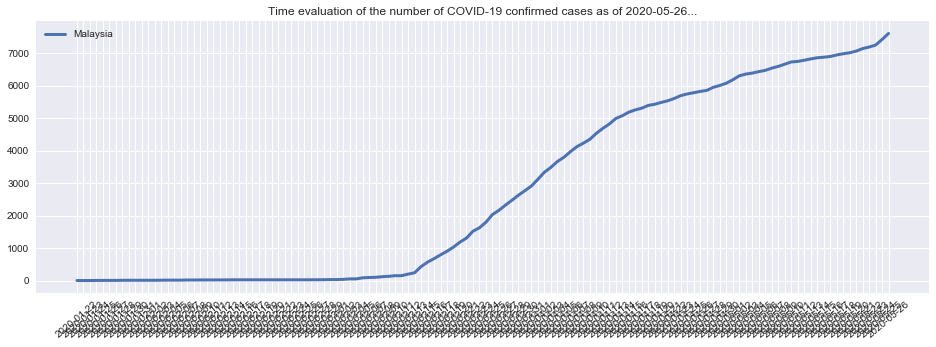

In [47]:
pltCountry_cases('confirmed','Malaysia')

In [48]:
# Time evaluation - Fatalities Cases
def pltCountry_fatalities(fatalities,*argv):
    f, ax=plt.subplots(figsize=(16,5))
    labels=argv
    for a in argv: 
        countryTS=trainTS_df.loc[(trainTS_df['country']==a)]
        plt.plot(countryTS['date'],countryTS['fatalities'],linewidth=3)
        plt.xticks(rotation=40)
        plt.legend(labels)
        ax.set(title=f'Time evalution of the number of COVID-19 fatalities cases as of {target_date}...' )


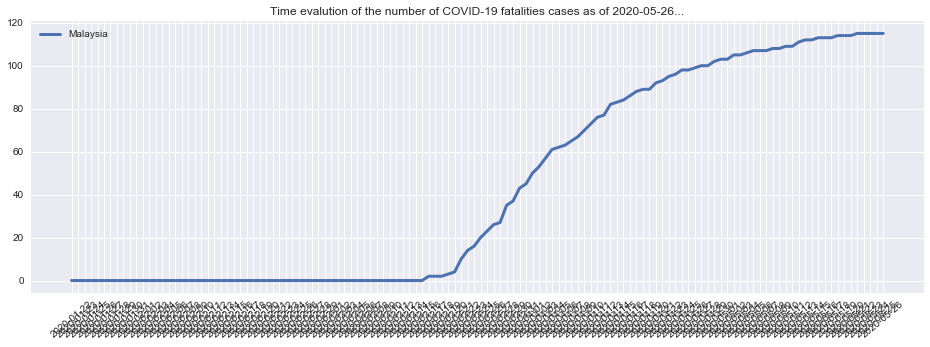

In [49]:
pltCountry_fatalities('fatalities','Malaysia')

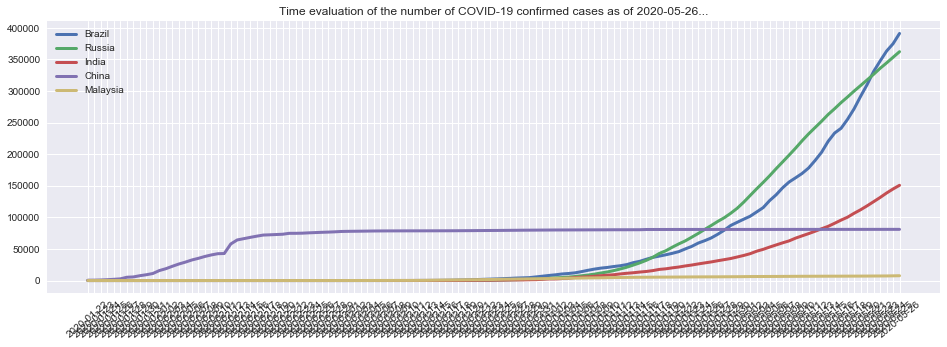

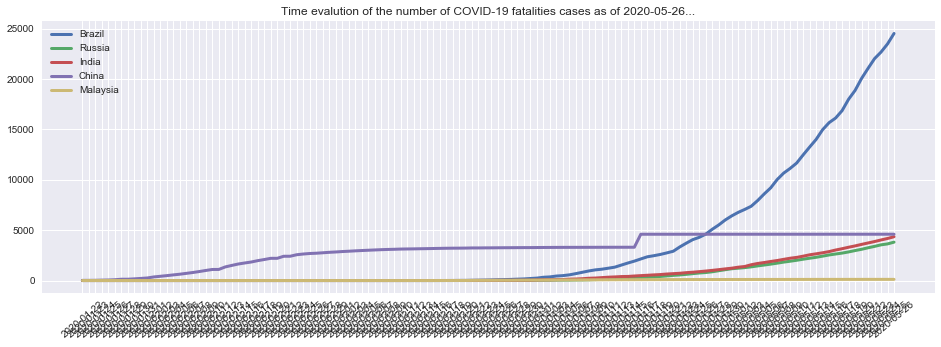

In [50]:
# Comparing a group of countries with similar evolution: Brazil, Russia, India, China + Malaysia
pltCountry_cases('confirmed', 'Brazil','Russia','India','China', 'Malaysia')
pltCountry_fatalities('fatilities','Brazil','Russia','India','China', 'Malaysia')

In [51]:
covid19_testSet['date'] = pd.to_datetime(covid19_testSet['date'])
covid19_trainSet['date'] = pd.to_datetime(covid19_trainSet['date'])

In [52]:
# Countries comparison for Confirmed COVID-19 cases
case='confirmed'
def timeCompare(time,*argv):
    Coun1=argv[0]
    Coun2=argv[1]
    f,ax=plt.subplots(figsize=(16,5))
    labels=argv  
    countryTS=trainTS_df.loc[(trainTS_df['country']==Coun1)]
    plt.plot(countryTS['date'],countryTS[case],linewidth=2)
    plt.xticks([])
    plt.legend(labels)
    ax.set(title=' Time Evaluation of actual COVID-19 cases',ylabel='Number of cases' )

    countryTS2=trainTS_df.loc[trainTS_df['country']==Coun2]
    #country2['Date']=country2['Date']-datetime.timedelta(days=time)
    plt.plot(countryTS2['date'],countryTS2[case],linewidth=2)
    # plt.xticks([])
    plt.legend(labels)
    ax.set(title=f' Time Evaluation of COVID-19 confirmed cases in %d days difference as of {target_date} '%time ,ylabel='Number of %s cases'%case )

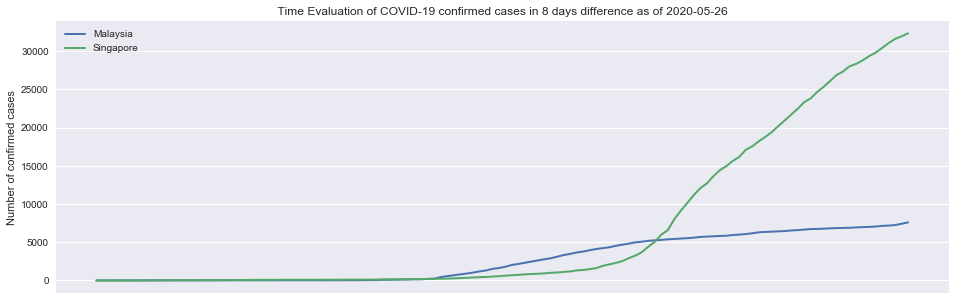

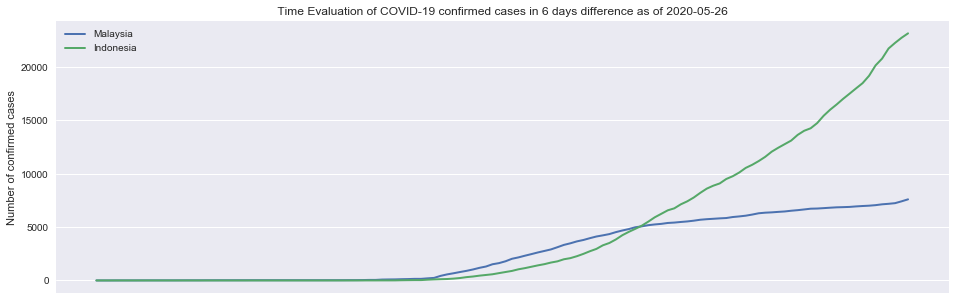

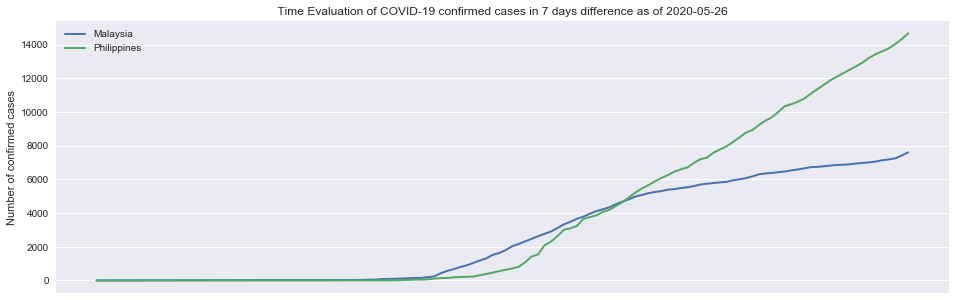

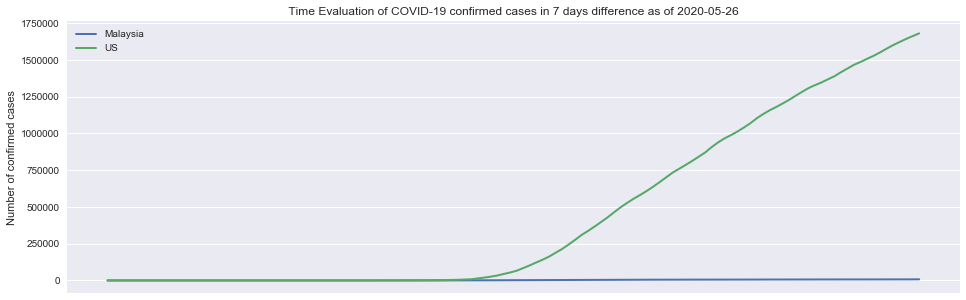

In [53]:
timeCompare(8,'Malaysia','Singapore')
timeCompare(6,'Malaysia','Indonesia')
timeCompare(7,'Malaysia','Philippines')
timeCompare(7,'Malaysia','US')

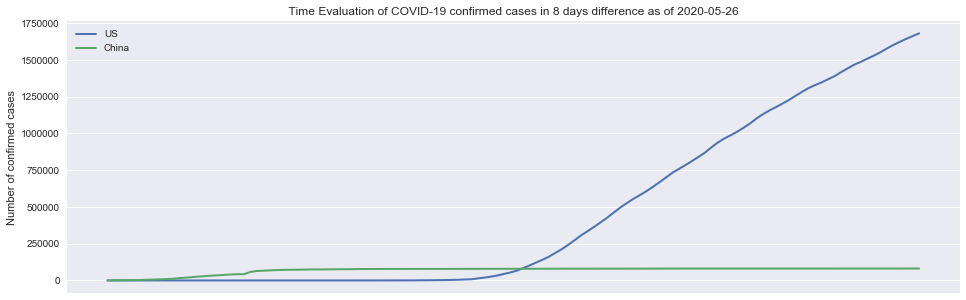

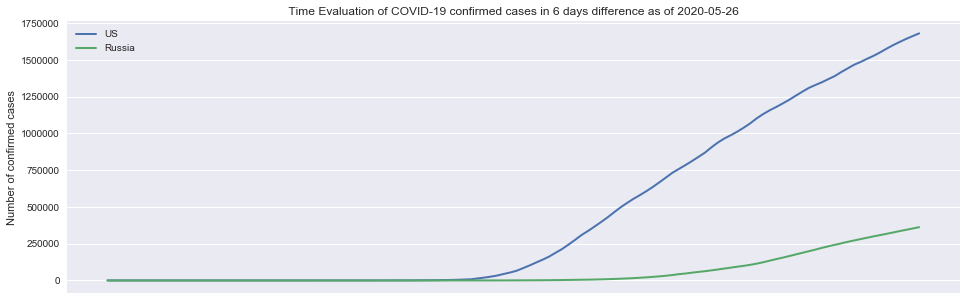

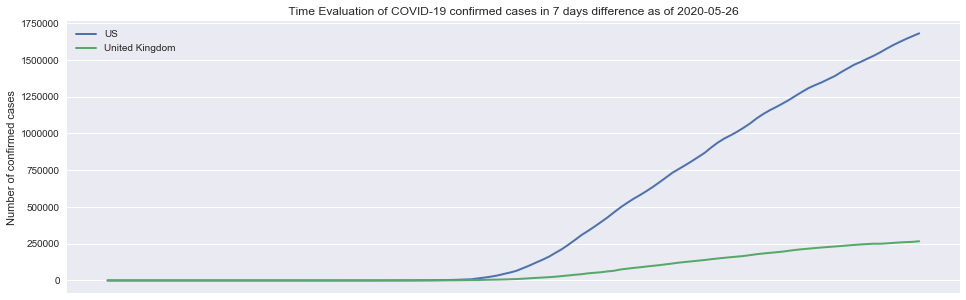

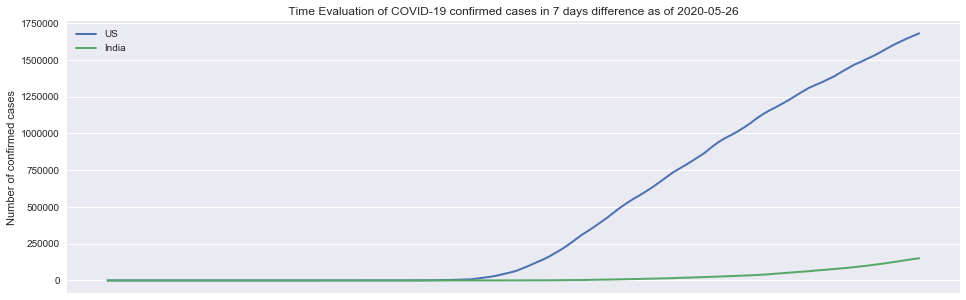

In [54]:
timeCompare(8,'US','China')
timeCompare(6,'US','Russia')
timeCompare(7,'US','United Kingdom')
timeCompare(7,'US','India')

In [55]:
# Auto-Regressive Integrated Moving Average (ARIMA) Model - is a class of statistical models for analyzing 
# and forecasting time series data. It explicitly caters to a suite of standard structures in time series data, 
# and as such provides a simple yet powerful method for making skillful time series forecasts.

# Cases distribution with rolling mean and standard deviation

sns.set(palette = 'Set1',style='darkgrid')

#Function for making a time serie on a designated country and plotting the rolled mean and standard 
def roll(country,case='confirmed'):
    ts=trainTS_df.loc[(trainTS_df['country']==country)]  
    ts=ts[['date',case]]
    ts=ts.set_index('date')
    ts.astype('int64')
    a=len(ts.loc[(ts['confirmed']>=10)])
    ts=ts[-a:]
    return (ts.rolling(window=4,center=False).mean().dropna())


def rollPlot(country, case='confirmed'):
    ts=trainTS_df.loc[(trainTS_df['country']==country)]  
    ts=ts[['date',case]]
    ts=ts.set_index('date')
    ts.astype('int64')
    a=len(ts.loc[(ts['confirmed']>=10)])
    ts=ts[-a:]
    plt.figure(figsize=(16,6))
    plt.plot(ts.rolling(window=7,center=False).mean().dropna(),label='Rolling Mean')
    plt.plot(ts[case])
    plt.plot(ts.rolling(window=7,center=False).std(),label='Rolling Standard')
    plt.legend()
    plt.title(f'COVID-19 confirmed cases distribution in %s with rolling mean and rolling standard as of {target_date}' %country)
    plt.xticks([])


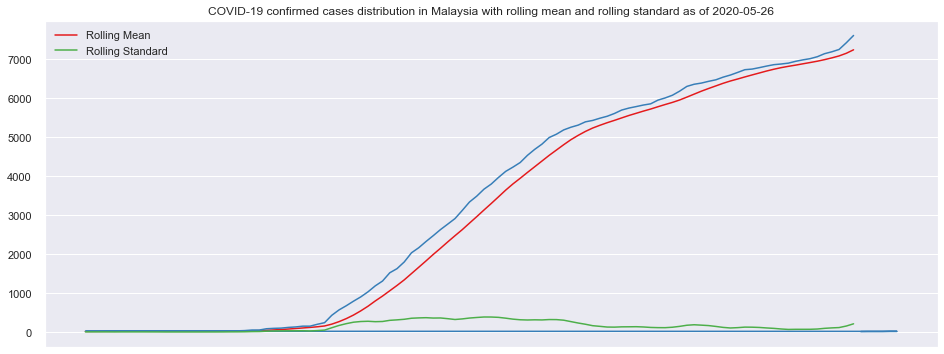

In [56]:
tsC1=roll('Malaysia')
rollPlot('Malaysia')

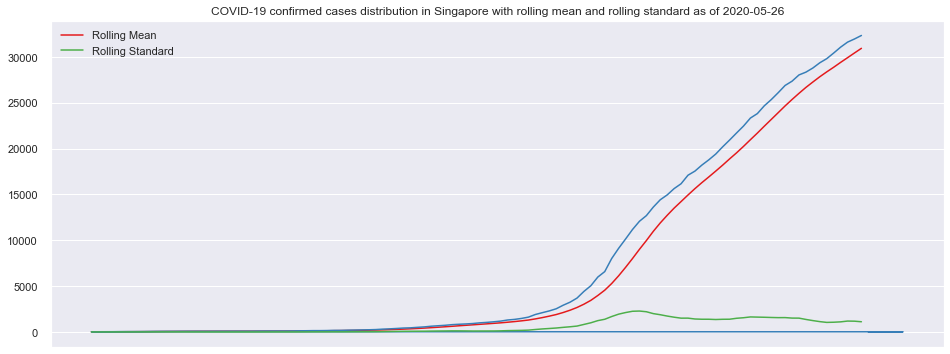

In [57]:
tsC2=roll('Singapore')
rollPlot('Singapore')

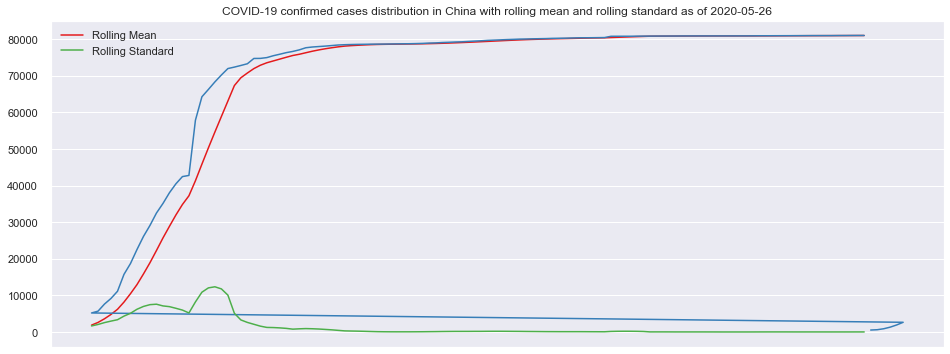

In [58]:
tsC3=roll('China')
rollPlot('China')

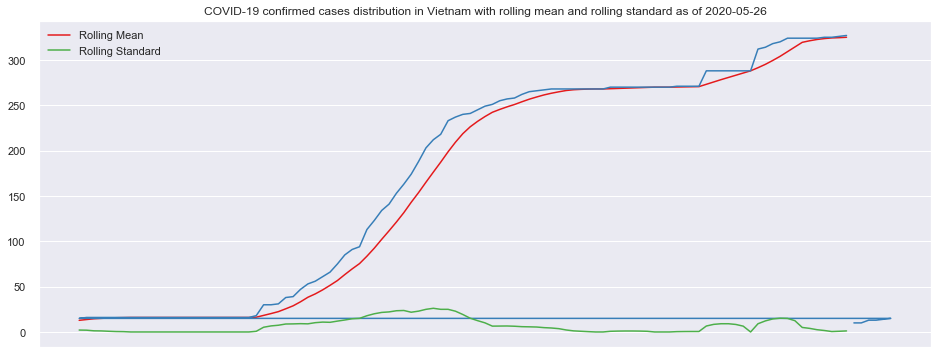

In [59]:
tsC4=roll('Vietnam')
rollPlot('Vietnam')

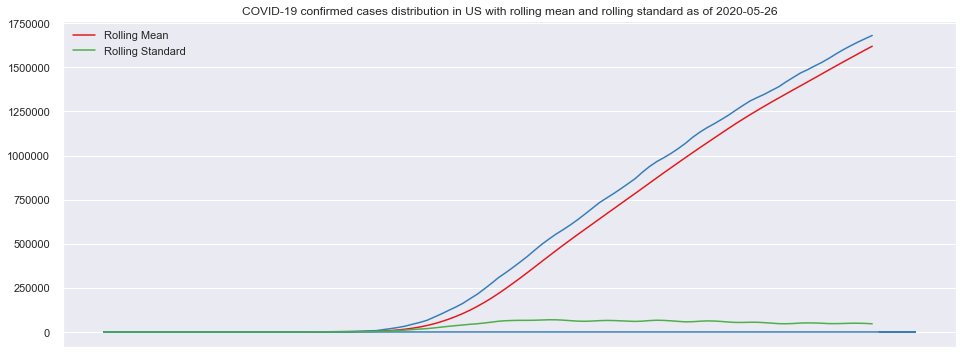

In [60]:
tsC5=roll('US')
rollPlot('US')

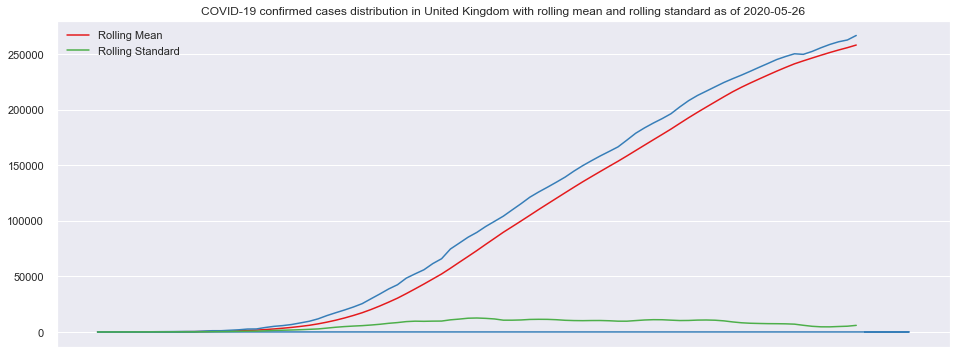

In [61]:
tsC6=roll('United Kingdom')
rollPlot('United Kingdom')

        TIME SERIES DECOMPOSITION RESULT FOR MALAYSIA AS OF 2020-05-26


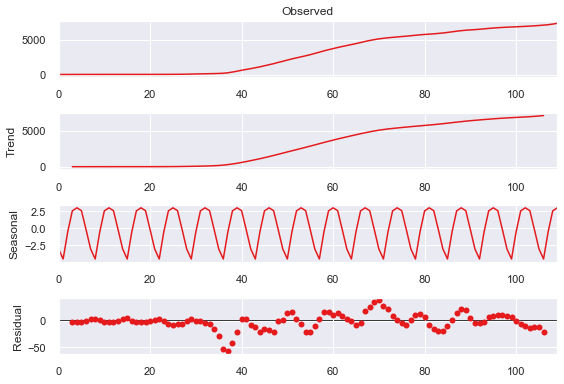

In [62]:
#Decomposing the ts to find its properties - Malaysia
print(txtStyle.BOLD + f'        TIME SERIES DECOMPOSITION RESULT FOR MALAYSIA AS OF {target_date}' + txtStyle.END)
fig=sm.tsa.seasonal_decompose(tsC1.values,freq=7).plot()

        TIME SERIES DECOMPOSITION RESULT FOR SINGAPORE AS OF 2020-05-26


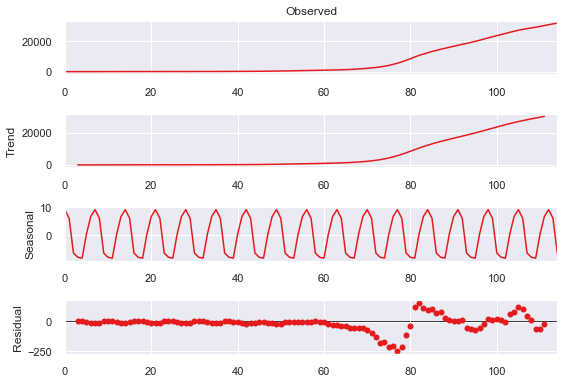

In [63]:
#Decomposing the ts to find its properties - Singapore
print(txtStyle.BOLD + f'        TIME SERIES DECOMPOSITION RESULT FOR SINGAPORE AS OF {target_date}' + txtStyle.END)
fig=sm.tsa.seasonal_decompose(tsC2.values,freq=7).plot()

        TIME SERIES DECOMPOSITION RESULT FOR CHINA AS OF 2020-05-26


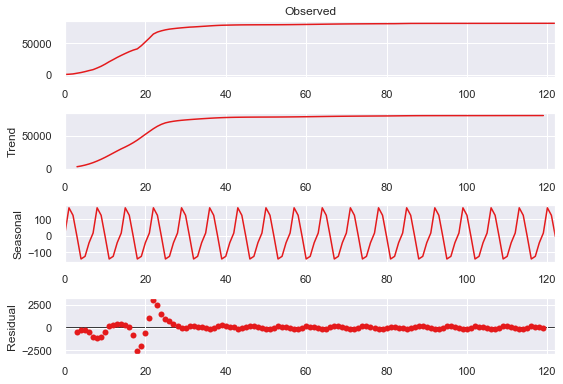

In [64]:
#Decomposing the ts to find its properties - China
print(txtStyle.BOLD + f'        TIME SERIES DECOMPOSITION RESULT FOR CHINA AS OF {target_date}' + txtStyle.END)
fig=sm.tsa.seasonal_decompose(tsC3.values,freq=7).plot()

        TIME SERIES DECOMPOSITION RESULT FOR VIETNAM AS OF 2020-05-26


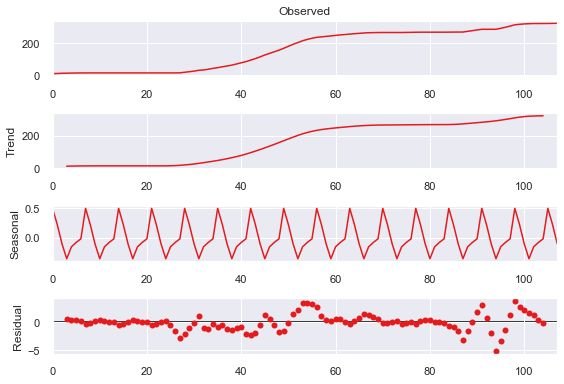

In [65]:
#Decomposing the ts to find its properties - Vietnam
print(txtStyle.BOLD + f'        TIME SERIES DECOMPOSITION RESULT FOR VIETNAM AS OF {target_date}' + txtStyle.END)
fig=sm.tsa.seasonal_decompose(tsC4.values,freq=7).plot()

          TIME SERIES DECOMPOSITION RESULT FOR US AS OF 2020-05-26


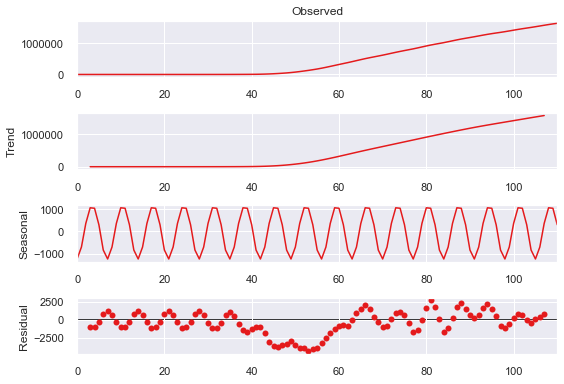

In [66]:
#Decomposing the ts to find its properties - US
print(txtStyle.BOLD + f'          TIME SERIES DECOMPOSITION RESULT FOR US AS OF {target_date}' + txtStyle.END)
fig=sm.tsa.seasonal_decompose(tsC5.values,freq=7).plot()

        TIME SERIES DECOMPOSITION RESULT FOR UNITED KINGDOM AS OF 2020-05-26


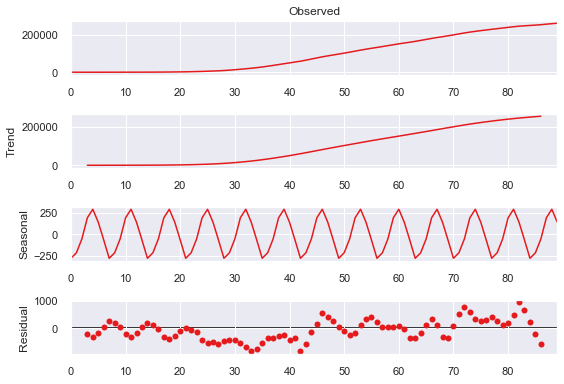

In [67]:
#Decomposing the ts to find its properties - United Kingdom
print(txtStyle.BOLD + f'        TIME SERIES DECOMPOSITION RESULT FOR UNITED KINGDOM AS OF {target_date}' + txtStyle.END)
fig=sm.tsa.seasonal_decompose(tsC6.values,freq=7).plot()

In [68]:
# Function to check the stationarity of the time serie using Dickey fuller test
# Here the p-value helps us to reject the null hypothesis of the non-stationarity of the data with confidence, but
# that assumption is sometimes not enough, we should also consider the time series might not be an AR (auto-regression).
# This supposedly means that the parameter i(d) will be 0 and the model would be an ARMA model.

def stationarity(ts):
    print('Results of Dickey-Fuller Test:')
    test = adfuller(ts, autolag='AIC')
    results = pd.Series(test[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for i,val in test[4].items():
        results['Critical Value (%s)'%i] = val
    print (results)

In [69]:
#For Malaysia
print(txtStyle.BOLD + txtStyle.UNDERLINE + f'TIME SERIES STATIONARITY TEST FOR MALAYSIA AS OF {target_date}' + txtStyle.END)
tsC=tsC1['confirmed'].values
stationarity(tsC)

TIME SERIES STATIONARITY TEST FOR MALAYSIA AS OF 2020-05-26
Results of Dickey-Fuller Test:
Test Statistic                  0.577668
p-value                         0.987052
#Lags Used                     13.000000
Number of Observations Used    96.000000
Critical Value (1%)            -3.500379
Critical Value (5%)            -2.892152
Critical Value (10%)           -2.583100
dtype: float64


In [70]:
#For Singapore
print(txtStyle.BOLD + txtStyle.UNDERLINE + f'TIME SERIES STATIONARITY TEST FOR SINGAPORE AS OF {target_date}' + txtStyle.END)
tsC=tsC2['confirmed'].values
stationarity(tsC)

TIME SERIES STATIONARITY TEST FOR SINGAPORE AS OF 2020-05-26
Results of Dickey-Fuller Test:
Test Statistic                  -1.935558
p-value                          0.315523
#Lags Used                      13.000000
Number of Observations Used    101.000000
Critical Value (1%)             -3.496818
Critical Value (5%)             -2.890611
Critical Value (10%)            -2.582277
dtype: float64


In [71]:
#For China
print(txtStyle.BOLD + txtStyle.UNDERLINE + f'TIME SERIES STATIONARITY TEST FOR CHINA AS OF {target_date}' + txtStyle.END)
tsC=tsC3['confirmed'].values
stationarity(tsC)

TIME SERIES STATIONARITY TEST FOR CHINA AS OF 2020-05-26
Results of Dickey-Fuller Test:
Test Statistic                  -4.558861
p-value                          0.000154
#Lags Used                      13.000000
Number of Observations Used    109.000000
Critical Value (1%)             -3.491818
Critical Value (5%)             -2.888444
Critical Value (10%)            -2.581120
dtype: float64


In [72]:
#For Vietnam
print(txtStyle.BOLD + txtStyle.UNDERLINE + f'TIME SERIES STATIONARITY TEST FOR VIETNAM AS OF {target_date}' + txtStyle.END)
tsC=tsC4['confirmed'].values
stationarity(tsC)

TIME SERIES STATIONARITY TEST FOR VIETNAM AS OF 2020-05-26
Results of Dickey-Fuller Test:
Test Statistic                 -1.398053
p-value                         0.583209
#Lags Used                     13.000000
Number of Observations Used    94.000000
Critical Value (1%)            -3.501912
Critical Value (5%)            -2.892815
Critical Value (10%)           -2.583454
dtype: float64


In [73]:
#For US
print(txtStyle.BOLD + txtStyle.UNDERLINE + f'TIME SERIES STATIONARITY TEST FOR US AS OF {target_date}' + txtStyle.END)
tsC=tsC5['confirmed'].values
stationarity(tsC)

TIME SERIES STATIONARITY TEST FOR US AS OF 2020-05-26
Results of Dickey-Fuller Test:
Test Statistic                  -0.228916
p-value                          0.934986
#Lags Used                       9.000000
Number of Observations Used    101.000000
Critical Value (1%)             -3.496818
Critical Value (5%)             -2.890611
Critical Value (10%)            -2.582277
dtype: float64


In [74]:
#For UK
print(txtStyle.BOLD + txtStyle.UNDERLINE + f'TIME SERIES STATIONARITY TEST FOR UNITED KINGDOM AS OF {target_date}' + txtStyle.END)
tsC=tsC6['confirmed'].values
stationarity(tsC)

TIME SERIES STATIONARITY TEST FOR UNITED KINGDOM AS OF 2020-05-26
Results of Dickey-Fuller Test:
Test Statistic                  0.327852
p-value                         0.978587
#Lags Used                     10.000000
Number of Observations Used    79.000000
Critical Value (1%)            -3.515977
Critical Value (5%)            -2.898886
Critical Value (10%)           -2.586694
dtype: float64


In [75]:
# Auto Correlation Function (ACF) and Partial Auto Correclation Function (PACF)
# As the p-value helps us to reject the null hypothesis of the non-stationarity of the data with confidence, 
# but that assumption is sometimes not enough, we should also consider the time series might not be an AR (auto-regression).
# This supposedly means that the parameter i(d) will be 0 and the model would be an ARMA model.

def corr(ts):
    plot_acf(ts,lags=12,title="Auto Correlation Function (ACF)")
    plot_pacf(ts,lags=12,title="Partial Auto Correclation Function (PACF)")
    

AUTO CORRELATION FUNCTION FOR MALAYSIA AS OF 2020-05-26


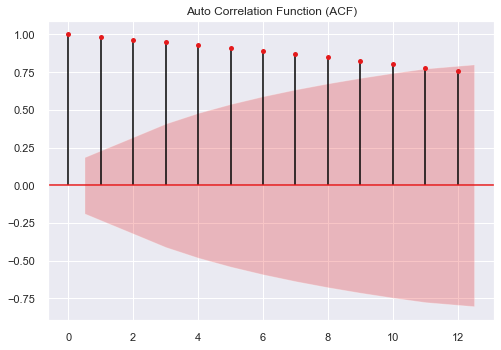

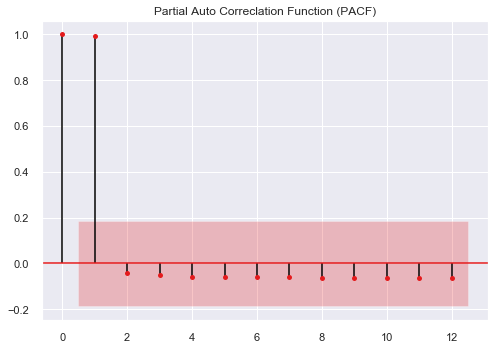

In [76]:
# For Malaysia
print(txtStyle.BOLD + txtStyle.UNDERLINE + f'AUTO CORRELATION FUNCTION FOR MALAYSIA AS OF {target_date}' + txtStyle.END)
corr(tsC1)

AUTO CORRELATION FUNCTION FOR SINGAPORE AS OF 2020-05-26


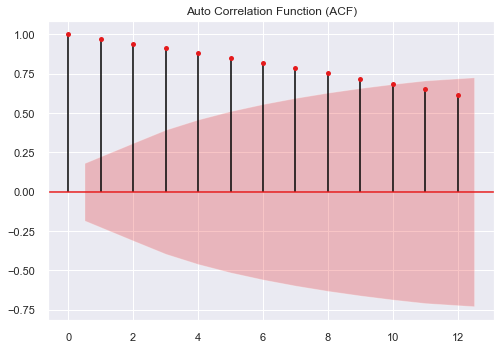

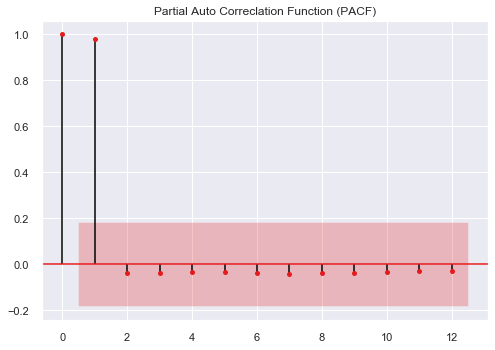

In [77]:
# For Singapore
print(txtStyle.BOLD + txtStyle.UNDERLINE + f'AUTO CORRELATION FUNCTION FOR SINGAPORE AS OF {target_date}' + txtStyle.END)
corr(tsC2)

AUTO CORRELATION FUNCTION FOR CHINA AS OF 2020-05-26


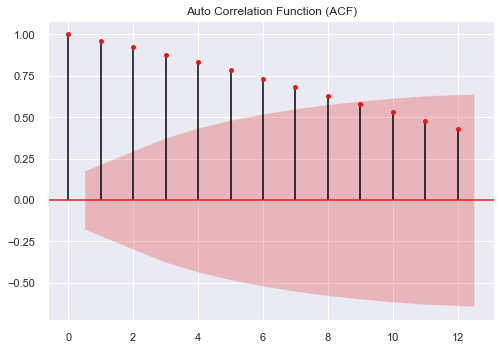

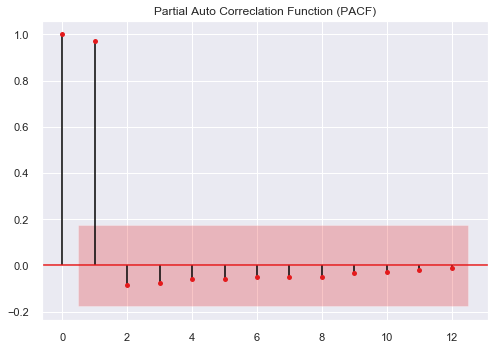

In [78]:
# For China
print(txtStyle.BOLD + txtStyle.UNDERLINE + f'AUTO CORRELATION FUNCTION FOR CHINA AS OF {target_date}' + txtStyle.END)
corr(tsC3)

In [79]:
#---
#  Interpretation and Evaluation: based on the factuals and diagnostics to forecast/predict COVID-19 confirmed cases 
#                                 for following week
#---

In [80]:
# Building the model
covid19_trainSet = covid19_trainSet.set_index(['date'])
covid19_testSet = covid19_testSet.set_index(['date'])

In [81]:
def create_features(trainTS_df,label=None):
    """
    Creates time series features from datetime index.
    """
    trainTS_df = trainTS_df.copy()
    trainTS_df['date'] = trainTS_df.index
#     trainTS_df['hour'] = trainTS_df['date'].dt.hour
#     trainTS_df['dayofweek'] = trainTS_df['date'].dt.dayofweek
#     trainTS_df['quarter'] = trainTS_df['date'].dt.quarter
#     trainTS_df['month'] = trainTS_df['date'].dt.month
#     trainTS_df['year'] = trainTS_df['date'].dt.year
#     trainTS_df['dayofyear'] = trainTS_df['date'].dt.dayofyear
#     trainTS_df['dayofmonth'] = trainTS_df['date'].dt.day
#     trainTS_df['weekofyear'] = trainTS_df['date'].dt.weekofyear
    
#     X = trainTS_df[['hour','dayofweek','quarter','month','year',
#            'dayofyear','dayofmonth','weekofyear']]
    X = trainTS_df[['date']]
   
    return X

In [82]:
train_features=pd.DataFrame(create_features(covid19_trainSet))
test_features=pd.DataFrame(create_features(covid19_testSet))
features_and_target_train = pd.concat([covid19_trainSet,train_features], axis=1)
features_and_target_test = pd.concat([covid19_testSet,test_features], axis=1)
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
def FunLabelEncoder(df):
    for c in trainTS_df.columns:
        if trainTS_df.dtypes[c] == object:
            le.fit(trainTS_df[c].astype(str))
            trainTS_df[c] = le.transform(trainTS_df[c].astype(str))
    return trainTS_df
features_and_target_train= FunLabelEncoder(features_and_target_train)

In [83]:
# x_train= features_and_target_train[['country','month', 'dayofyear', 'dayofmonth' , 'weekofyear']]
x_train= features_and_target_train[['country','date']]
y1 = features_and_target_train[['confirmed']]
y2 =features_and_target_train[['fatalities']]
# x_test = features_and_target_test[['country', 'month', 'dayofyear', 'dayofmonth' , 'weekofyear']]
x_test = features_and_target_test[['country', 'date']]

                             ARIMA Model Results                              
Dep. Variable:           D2.confirmed   No. Observations:                   86
Model:                 ARIMA(0, 2, 4)   Log Likelihood                -306.547
Method:                       css-mle   S.D. of innovations              8.079
Date:                Wed, 27 May 2020   AIC                            625.093
Time:                        17:36:17   BIC                            639.820
Sample:                    02-09-2020   HQIC                           631.020
                         - 05-04-2020                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.9070      1.585      0.572      0.567      -2.199       4.013
ma.L1.D2.confirmed     0.4457      0.113      3.962      0.000       0.225       0.666
ma.L2.D2.confirmed  

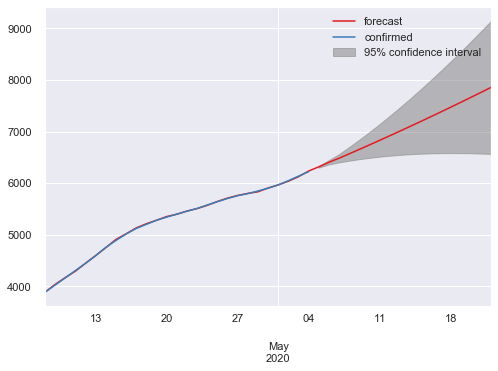

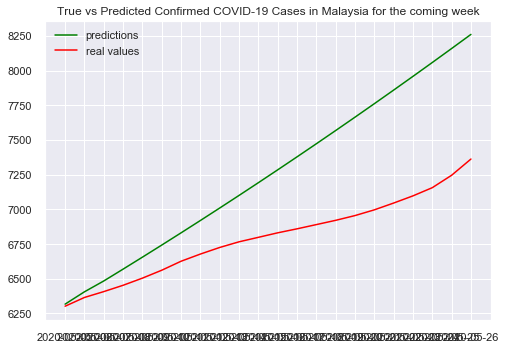

In [84]:
# Mean absolute percentage error for Confirmed Cases in Malaysia
def mape(y1, y_pred): 
    y1, y_pred = np.array(y1), np.array(y_pred)
    return np.mean(np.abs((y1 - y_pred) / y1)) * 100

def split(ts):
    #splitting 80%/20% because of little amount of data
    size = int(len(ts) * 0.80)
    covid19_trainSet = ts[:size]
    covid19_testSet = ts[size:]
    return(covid19_trainSet,covid19_testSet)


#Arima modeling for ts
def arima(ts,covid19_testSet):
    p=d=q=range(0,6)
    a=99999
    pdq=list(itertools.product(p,d,q))
    
    #Determining the best parameters
    for var in pdq:
        try:
            model = ARIMA(ts, order=var)
            result = model.fit()

            if (result.aic<=a) :
                a=result.aic
                param=var
        except:
            continue
            
    #Modeling
    model = ARIMA(ts, order=param)
    result = model.fit()
    result.plot_predict(start=int(len(ts) * 0.7), end=int(len(ts) * 1.2))
    pred=result.forecast(steps=len(covid19_testSet))[0]
    
    #Plotting results
    f,ax=plt.subplots()
    plt.plot(pred,c='green', label= 'predictions')
    plt.plot(covid19_testSet, c='red',label='real values')
    plt.legend()
    plt.title('True vs Predicted Confirmed COVID-19 Cases in Malaysia for the coming week')
    #Printing the error metrics
    print(result.summary())        
    
    print('\nMean absolute percentage error: %f'%mape(covid19_testSet,pred))
    return (pred)



covid19_trainSet,covid19_testSet=split(tsC1)
pred=arima(covid19_trainSet,covid19_testSet)

                             ARIMA Model Results                              
Dep. Variable:           D2.confirmed   No. Observations:                   90
Model:                 ARIMA(5, 2, 4)   Log Likelihood                -433.810
Method:                       css-mle   S.D. of innovations             28.161
Date:                Wed, 27 May 2020   AIC                            889.619
Time:                        17:37:04   BIC                            917.117
Sample:                    02-04-2020   HQIC                           900.708
                         - 05-03-2020                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  7.4338      3.237      2.296      0.022       1.089      13.778
ar.L1.D2.confirmed     0.3118      0.109      2.863      0.004       0.098       0.525
ar.L2.D2.confirmed  

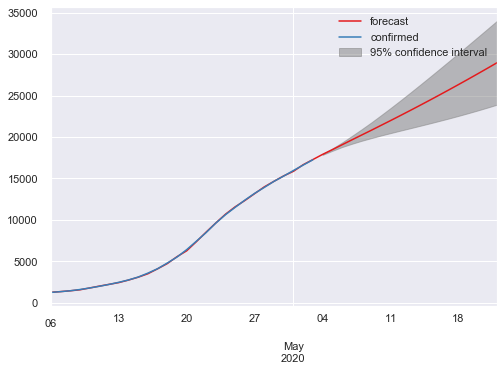

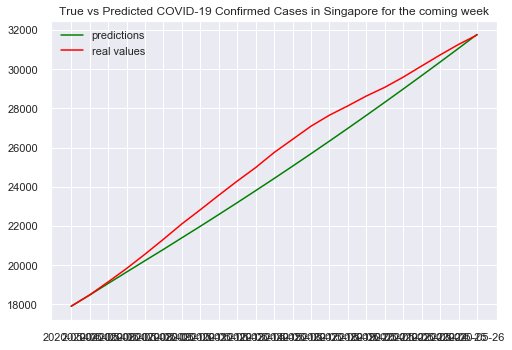

In [85]:
# Mean absolute percentage error for Confirmed Cases in Singapore
def mape(y2, y_pred): 
    y2, y_pred = np.array(y2), np.array(y_pred)
    return np.mean(np.abs((y2 - y_pred) / y2)) * 100

def split(ts):
    #splitting 80%/20% because of little amount of data
    size = int(len(ts) * 0.80)
    covid19_trainSet= ts[:size]
    covid19_testSet = ts[size:]
    return(covid19_trainSet,covid19_testSet)


#Arima modeling for ts
def arima(ts,covid19_testSet):
    p=d=q=range(0,6)
    a=99999
    pdq=list(itertools.product(p,d,q))
    
    #Determining the best parameters
    for var in pdq:
        try:
            model = ARIMA(ts, order=var)
            result = model.fit()

            if (result.aic<=a) :
                a=result.aic
                param=var
        except:
            continue
            
    #Modeling
    model = ARIMA(ts, order=param)
    result = model.fit()
    result.plot_predict(start=int(len(ts) * 0.7), end=int(len(ts) * 1.2))
    pred=result.forecast(steps=len(covid19_testSet))[0]
    
    #Plotting results
    f,ax=plt.subplots()
    plt.plot(pred,c='green', label= 'predictions')
    plt.plot(covid19_testSet, c='red',label='real values')
    plt.legend()
    plt.title('True vs Predicted COVID-19 Confirmed Cases in Singapore for the coming week')
    #Printing the error metrics
    print(result.summary())        
    
    print('\nMean absolute percentage error: %f'%mape(covid19_testSet,pred))
    return (pred)



covid19_trainSet,covid19_testSet=split(tsC2)
pred=arima(covid19_trainSet,covid19_testSet)

                             ARIMA Model Results                              
Dep. Variable:           D2.confirmed   No. Observations:                   96
Model:                 ARIMA(0, 2, 4)   Log Likelihood                -713.454
Method:                       css-mle   S.D. of innovations                nan
Date:                Wed, 27 May 2020   AIC                           1438.907
Time:                        17:39:27   BIC                           1454.294
Sample:                    01-27-2020   HQIC                          1445.127
                         - 05-01-2020                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  1.1969     44.473      0.027      0.979     -85.969      88.363
ma.L1.D2.confirmed     0.2720      0.090      3.027      0.002       0.096       0.448
ma.L2.D2.confirmed  

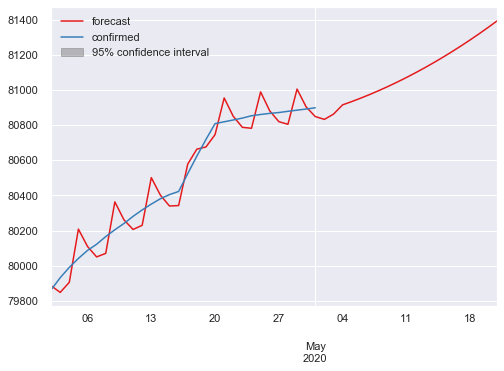

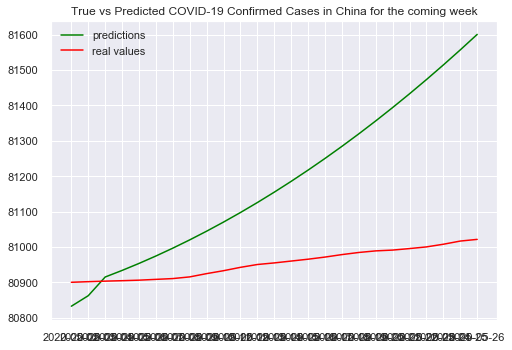

In [86]:
# Mean absolute percentage error for Confirmed Cases in China
def mape(y2, y_pred): 
    y2, y_pred = np.array(y2), np.array(y_pred)
    return np.mean(np.abs((y2 - y_pred) / y2)) * 100

def split(ts):
    #splitting 80%/20% because of little amount of data
    size = int(len(ts) * 0.80)
    covid19_trainSet= ts[:size]
    covid19_testSet = ts[size:]
    return(covid19_trainSet,covid19_testSet)


#Arima modeling for ts
def arima(ts,covid19_testSet):
    p=d=q=range(0,6)
    a=99999
    pdq=list(itertools.product(p,d,q))
    
    #Determining the best parameters
    for var in pdq:
        try:
            model = ARIMA(ts, order=var)
            result = model.fit()

            if (result.aic<=a) :
                a=result.aic
                param=var
        except:
            continue
            
    #Modeling
    model = ARIMA(ts, order=param)
    result = model.fit()
    result.plot_predict(start=int(len(ts) * 0.7), end=int(len(ts) * 1.2))
    pred=result.forecast(steps=len(covid19_testSet))[0]
    
    #Plotting results
    f,ax=plt.subplots()
    plt.plot(pred,c='green', label= 'predictions')
    plt.plot(covid19_testSet, c='red',label='real values')
    plt.legend()
    plt.title('True vs Predicted COVID-19 Confirmed Cases in China for the coming week')
    #Printing the error metrics
    print(result.summary())        
    
    print('\nMean absolute percentage error: %f'%mape(covid19_testSet,pred))
    return (pred)



covid19_trainSet,covid19_testSet=split(tsC3)
pred=arima(covid19_trainSet,covid19_testSet)

                             ARIMA Model Results                              
Dep. Variable:           D2.confirmed   No. Observations:                   84
Model:                 ARIMA(4, 2, 5)   Log Likelihood                 -89.543
Method:                       css-mle   S.D. of innovations              0.654
Date:                Wed, 27 May 2020   AIC                            201.086
Time:                        17:40:52   BIC                            227.825
Sample:                    02-11-2020   HQIC                           211.835
                         - 05-04-2020                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0028      0.131     -0.021      0.983      -0.260       0.254
ar.L1.D2.confirmed     0.1556      0.124      1.254      0.210      -0.088       0.399
ar.L2.D2.confirmed  

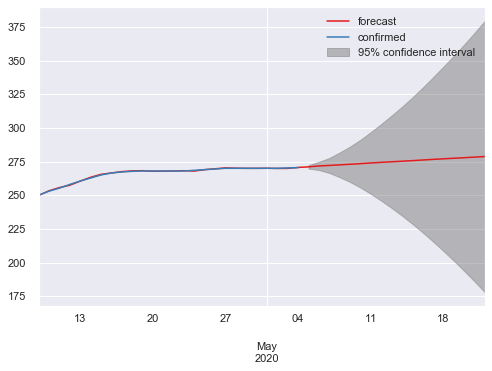

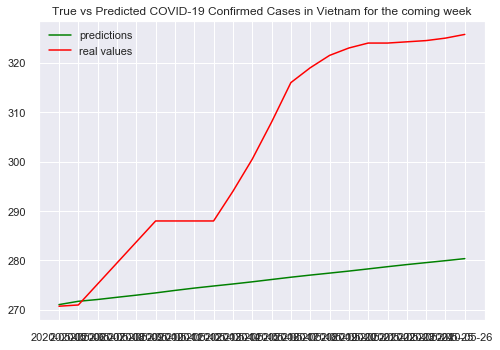

In [87]:
# Mean absolute percentage error for Confirmed Cases in Vietnam
def mape(y2, y_pred): 
    y2, y_pred = np.array(y2), np.array(y_pred)
    return np.mean(np.abs((y2 - y_pred) / y2)) * 100

def split(ts):
    #splitting 80%/20% because of little amount of data
    size = int(len(ts) * 0.80)
    covid19_trainSet= ts[:size]
    covid19_testSet = ts[size:]
    return(covid19_trainSet,covid19_testSet)


#Arima modeling for ts
def arima(ts,covid19_testSet):
    p=d=q=range(0,6)
    a=99999
    pdq=list(itertools.product(p,d,q))
    
    #Determining the best parameters
    for var in pdq:
        try:
            model = ARIMA(ts, order=var)
            result = model.fit()

            if (result.aic<=a) :
                a=result.aic
                param=var
        except:
            continue
            
    #Modeling
    model = ARIMA(ts, order=param)
    result = model.fit()
    result.plot_predict(start=int(len(ts) * 0.7), end=int(len(ts) * 1.2))
    pred=result.forecast(steps=len(covid19_testSet))[0]
    
    #Plotting results
    f,ax=plt.subplots()
    plt.plot(pred,c='green', label= 'predictions')
    plt.plot(covid19_testSet, c='red',label='real values')
    plt.legend()
    plt.title('True vs Predicted COVID-19 Confirmed Cases in Vietnam for the coming week')
    #Printing the error metrics
    print(result.summary())        
    
    print('\nMean absolute percentage error: %f'%mape(covid19_testSet,pred))
    return (pred)



covid19_trainSet,covid19_testSet=split(tsC4)
pred=arima(covid19_trainSet,covid19_testSet)

                             ARIMA Model Results                              
Dep. Variable:           D2.confirmed   No. Observations:                   86
Model:                 ARIMA(4, 2, 4)   Log Likelihood                -656.546
Method:                       css-mle   S.D. of innovations            465.134
Date:                Wed, 27 May 2020   AIC                           1333.092
Time:                        17:41:32   BIC                           1357.635
Sample:                    02-08-2020   HQIC                          1342.970
                         - 05-03-2020                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                222.5335    321.899      0.691      0.489    -408.377     853.444
ar.L1.D2.confirmed     1.2430      0.104     11.979      0.000       1.040       1.446
ar.L2.D2.confirmed  

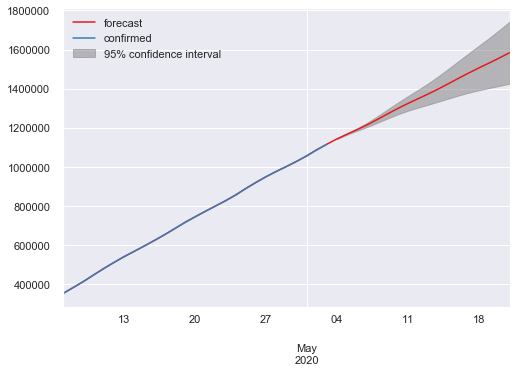

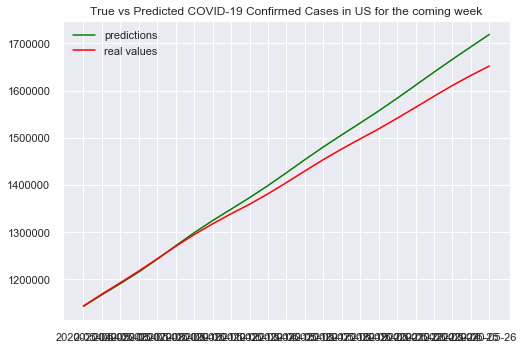

In [88]:
# Mean absolute percentage error for Confirmed Cases in US
def mape(y2, y_pred): 
    y2, y_pred = np.array(y2), np.array(y_pred)
    return np.mean(np.abs((y2 - y_pred) / y2)) * 100

def split(ts):
    #splitting 80%/20% because of little amount of data
    size = int(len(ts) * 0.80)
    covid19_trainSet= ts[:size]
    covid19_testSet = ts[size:]
    return(covid19_trainSet,covid19_testSet)


#Arima modeling for ts
def arima(ts,covid19_testSet):
    p=d=q=range(0,6)
    a=99999
    pdq=list(itertools.product(p,d,q))
    
    #Determining the best parameters
    for var in pdq:
        try:
            model = ARIMA(ts, order=var)
            result = model.fit()

            if (result.aic<=a) :
                a=result.aic
                param=var
        except:
            continue
            
    #Modeling
    model = ARIMA(ts, order=param)
    result = model.fit()
    result.plot_predict(start=int(len(ts) * 0.7), end=int(len(ts) * 1.2))
    pred=result.forecast(steps=len(covid19_testSet))[0]
    
    #Plotting results
    f,ax=plt.subplots()
    plt.plot(pred,c='green', label= 'predictions')
    plt.plot(covid19_testSet, c='red',label='real values')
    plt.legend()
    plt.title('True vs Predicted COVID-19 Confirmed Cases in US for the coming week')
    #Printing the error metrics
    print(result.summary())        
    
    print('\nMean absolute percentage error: %f'%mape(covid19_testSet,pred))
    return (pred)



covid19_trainSet,covid19_testSet=split(tsC5)
pred=arima(covid19_trainSet,covid19_testSet)

                             ARIMA Model Results                              
Dep. Variable:           D2.confirmed   No. Observations:                   70
Model:                 ARIMA(4, 2, 4)   Log Likelihood                -472.149
Method:                       css-mle   S.D. of innovations            190.527
Date:                Wed, 27 May 2020   AIC                            964.298
Time:                        17:42:05   BIC                            986.783
Sample:                    02-29-2020   HQIC                           973.229
                         - 05-08-2020                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 70.1184     31.652      2.215      0.027       8.081     132.156
ar.L1.D2.confirmed    -0.4262      0.213     -2.005      0.045      -0.843      -0.010
ar.L2.D2.confirmed  

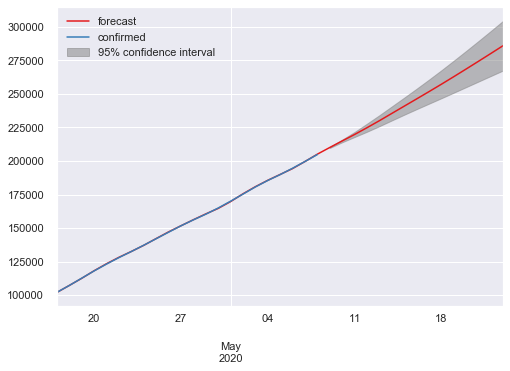

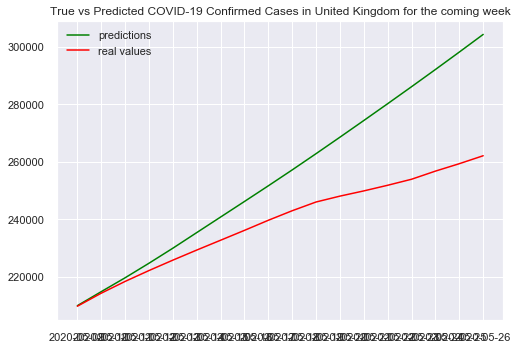

In [89]:
# Mean absolute percentage error for Confirmed Cases in United Kingdom
def mape(y2, y_pred): 
    y2, y_pred = np.array(y2), np.array(y_pred)
    return np.mean(np.abs((y2 - y_pred) / y2)) * 100

def split(ts):
    #splitting 80%/20% because of little amount of data
    size = int(len(ts) * 0.80)
    covid19_trainSet= ts[:size]
    covid19_testSet = ts[size:]
    return(covid19_trainSet,covid19_testSet)


#Arima modeling for ts
def arima(ts,covid19_testSet):
    p=d=q=range(0,6)
    a=99999
    pdq=list(itertools.product(p,d,q))
    
    #Determining the best parameters
    for var in pdq:
        try:
            model = ARIMA(ts, order=var)
            result = model.fit()

            if (result.aic<=a) :
                a=result.aic
                param=var
        except:
            continue
            
    #Modeling
    model = ARIMA(ts, order=param)
    result = model.fit()
    result.plot_predict(start=int(len(ts) * 0.7), end=int(len(ts) * 1.2))
    pred=result.forecast(steps=len(covid19_testSet))[0]
    
    #Plotting results
    f,ax=plt.subplots()
    plt.plot(pred,c='green', label= 'predictions')
    plt.plot(covid19_testSet, c='red',label='real values')
    plt.legend()
    plt.title('True vs Predicted COVID-19 Confirmed Cases in United Kingdom for the coming week')
    #Printing the error metrics
    print(result.summary())        
    
    print('\nMean absolute percentage error: %f'%mape(covid19_testSet,pred))
    return (pred)



covid19_trainSet,covid19_testSet=split(tsC6)
pred=arima(covid19_trainSet,covid19_testSet)